# A Pandemic: An Analysis of COVID-19 

## Amanda Le and Sneha Narayanan

### Introduction

COVID-19 has been a prevalent part of the past several months of our lives and as vaccines have come in order to help the future of all individuals it is important to look back and analyze the rollercoaster of a ride its been especially when picking apart the cases, not only specifically in North America but throughout the world over the period of the pandemic so far. Furthermore, consideration of other factors that are influencing the difference in COVID-19 cases in different places are also investigated. Delving into the specifics of this data is crucial at a time where a vaccine is used to help prevent the spread of the virus as well as learning more about the virus itself and what can help stop it. 

What is our end goal? We need to work together to make the number of cases go to zero and the only way to make this pivotal change is to understand where a majority of the cases are coming from not only at the current moment but over time and how to prevent spikes in cases. The strict guidelines with social distancing rules must continue to stay strong. We predict that earlier start dates as well as longer lockdown durations allowed for lower amount of total cases. Not only that but we believe that locations with higher poverty rates or population densities are key factors in having a higher positivity rate. There are also many other factors that we consider that could be affecting the spread of the virus. 

In our analysis, we will be visualizing the data of COVID-19 cases worldwide, then going specifically into North America where there are many cases. We will not only look at the total cases, but also discuss the amount of new cases over time. Here, we use different sklearn regression models in order to see which ML predicting method was the most accurate. After that, we analyze the different factors that could be potentially affecting the number of cases in an attempt to help reduce the number of cases in North America. 

In [1]:
!pip install folium
!pip install plotly
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from sklearn import linear_model as lm 
from sklearn import ensemble
from sklearn import svm
from sklearn import tree
from sklearn import neighbors
import folium
from folium import plugins as plugins
import plotly.express as px
import warnings 
warnings.filterwarnings('ignore')

### Data Scraping

To analyze the data over time for North America, we will scrape the data and get it daily beginning April 12th. Since the data was for every state (including U.S. territories) we will get the data per day and then concatenate it for each month and save them into separate dataframes. We will use data sourced from github and received COVID-19 cases from a reputable source by the Center of Systems Science and Engineering at Johns Hopkins University: https://github.com/CSSEGISandData/COVID-19 where even more data could be found. Not only that, but there were many sources that had used this data in order to provide a great interactive view of data throughout the world such as: https://ourworldindata.org/coronavirus. We will scrape the latest data that has been documented so far.

This is how we scrape the data for North America (using daily COVID data by state/territories and save them by month):

In [2]:
# This is for the month of April (data only begins from April 12th onwards)
li=[]
for i in range(12, 31):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '04'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_april = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_april

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-04-12 23:18:15,32.3182,-86.9023,3667,93,NaN,3470.0,1.0,75.988020,21583.0,437.0,2.610160,84000001,USA,460.300152,12.264945
1,Alaska,US,2020-04-12 23:18:15,61.3707,-152.4044,272,8,66.0,264.0,2.0,45.504049,8038.0,31.0,2.941176,84000002,USA,1344.711576,11.397059
2,Arizona,US,2020-04-12 23:18:15,33.7298,-111.4312,3542,115,NaN,3427.0,4.0,48.662422,42109.0,NaN,3.246753,84000004,USA,578.522286,NaN
3,Arkansas,US,2020-04-12 23:18:15,34.9697,-92.3731,1280,27,367.0,1253.0,5.0,49.439423,19722.0,130.0,2.109375,84000005,USA,761.753354,10.156250
4,California,US,2020-04-12 23:18:15,36.1162,-119.6816,22795,640,NaN,22155.0,6.0,58.137726,190328.0,5234.0,2.812020,84000006,USA,485.423868,22.961176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-05-01 02:32:32,37.7693,-78.1700,15847,552,2104.0,13191.0,51.0,200.411522,91509.0,3654.0,3.483309,84000051,USA,1157.282639,23.057992
54,Washington,US,2020-05-01 02:32:32,47.4009,-121.4905,14327,836,0.0,13513.0,53.0,189.776596,187800.0,NaN,5.681580,84000053,USA,2487.613921,NaN
55,West Virginia,US,2020-05-01 02:32:32,38.4912,-80.9545,1125,41,545.0,539.0,54.0,85.034142,44541.0,NaN,3.644444,84000054,USA,3366.671756,NaN
56,Wisconsin,US,2020-05-01 02:32:32,44.2685,-89.6165,6854,316,3352.0,3186.0,55.0,132.455425,76248.0,1512.0,4.610446,84000055,USA,1473.513456,22.060111


In [3]:
# This is for the month of May 
li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '05'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 32):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '05'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_may = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_may

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-05-02 02:32:31,32.3182,-86.9023,7440,289,0.0,7005.0,1,155.558973,91933.0,1008.0,3.962161,84000001,USA,1960.653006,13.819578
1,Alaska,US,2020-05-02 02:32:31,61.3707,-152.4044,364,9,254.0,101.0,2,60.895125,20325.0,NaN,2.472527,84000002,USA,3400.256629,NaN
2,American Samoa,US,2020-05-02 02:32:31,-14.2710,-170.1320,0,0,0.0,0.0,60,0.000000,57.0,NaN,NaN,16,ASM,102.442444,NaN
3,Arizona,US,2020-05-02 02:32:31,33.7298,-111.4312,7969,330,1528.0,6111.0,4,109.483581,74879.0,1203.0,4.141047,84000004,USA,1028.738993,15.095997
4,Arkansas,US,2020-05-02 02:32:31,34.9697,-92.3731,3337,64,1973.0,1300.0,5,128.890120,49676.0,414.0,1.917890,84000005,USA,1918.713092,12.406353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-06-01 02:32:54,37.7693,-78.1700,44607,1375,5868.0,37364.0,51,522.604425,315391.0,7326.0,3.082476,84000051,USA,3695.041860,16.423431
54,Washington,US,2020-06-01 02:32:54,47.4009,-121.4905,21702,1123,NaN,20584.0,53,284.994156,354354.0,3480.0,5.151599,84000053,USA,4653.433738,16.035388
55,West Virginia,US,2020-06-01 02:32:54,38.4912,-80.9545,2010,75,1303.0,632.0,54,112.155978,97622.0,NaN,3.731343,84000054,USA,5447.209409,NaN
56,Wisconsin,US,2020-06-01 02:32:54,44.2685,-89.6165,18403,592,11646.0,6165.0,55,316.070564,268506.0,2583.0,3.216867,84000055,USA,4611.576533,14.035755


In [4]:
# This is for the month of June 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '06'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 31):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '06'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_june = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_june

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-06-02 02:33:16,32.3182,-86.9023,18525,646,9355.0,8629.0,1,379.957110,223523.0,1856.0,3.467525,84000001.0,USA,4558.730703,9.962426
1,Alaska,US,2020-06-02 02:33:16,61.3707,-152.4044,466,10,368.0,88.0,2,63.700798,54190.0,NaN,2.145923,84000002.0,USA,7407.609921,NaN
2,American Samoa,US,2020-06-02 02:33:16,-14.2710,-170.1320,0,0,NaN,0.0,60,0.000000,174.0,NaN,NaN,16.0,ASM,312.719038,NaN
3,Arizona,US,2020-06-02 02:33:16,33.7298,-111.4312,20129,918,4869.0,14342.0,4,276.545990,228070.0,3018.0,4.560584,84000004.0,USA,3133.381886,14.993293
4,Arkansas,US,2020-06-02 02:33:16,34.9697,-92.3731,7443,133,5401.0,1909.0,5,246.636296,133236.0,711.0,1.786914,84000005.0,USA,4414.998456,9.552600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-07-01 04:34:05,37.7693,-78.1700,62787,1763,8080.0,52944.0,51,735.596746,645034.0,8982.0,2.807906,84000051.0,USA,7557.056577,14.305509
54,Washington,US,2020-07-01 04:34:05,47.4009,-121.4905,33439,1303,NaN,31492.0,53,431.050049,548220.0,4323.0,4.058006,84000053.0,USA,7199.313241,13.170241
55,West Virginia,US,2020-07-01 04:34:05,38.4912,-80.9545,2905,93,2272.0,540.0,54,162.096078,171764.0,NaN,3.201377,84000054.0,USA,9584.258434,NaN
56,Wisconsin,US,2020-07-01 04:34:05,44.2685,-89.6165,28659,784,22587.0,5288.0,55,492.216829,571201.0,3446.0,2.735615,84000055.0,USA,9810.347356,12.024146


In [5]:
# This is for the month of July 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '07'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 32):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '07'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_july = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_july

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-07-02 04:33:59,32.3182,-86.9023,39647,972,18866.0,19124.0,1,794.626350,413953.0,2803.0,2.494738,84000001,USA,8442.532762,7.194189
1,Alaska,US,2020-07-02 04:33:59,61.3707,-152.4044,975,14,528.0,433.0,2,133.279566,114400.0,NaN,1.435897,84000002,USA,15638.135726,NaN
2,American Samoa,US,2020-07-02 04:33:59,-14.2710,-170.1320,0,0,NaN,0.0,60,0.000000,696.0,NaN,NaN,16,ASM,1250.876152,NaN
3,Arizona,US,2020-07-02 04:33:59,33.7298,-111.4312,84105,1725,9715.0,72665.0,4,1155.492101,549596.0,4837.0,2.051008,84000004,USA,7550.726316,5.751144
4,Arkansas,US,2020-07-02 04:33:59,34.9697,-92.3731,21197,277,15163.0,5757.0,5,702.398168,314858.0,1448.0,1.306789,84000005,USA,10433.348223,6.831155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-08-01 04:36:46,37.7693,-78.1700,89888,2174,11937.0,75777.0,51,1053.105265,1110747.0,13271.0,2.418565,84000051,USA,13013.233290,14.763928
54,Washington,US,2020-08-01 04:36:46,47.4009,-121.4905,57586,1603,NaN,54239.0,53,732.813974,973654.0,5568.0,2.802717,84000053,USA,12786.180975,9.977958
55,West Virginia,US,2020-08-01 04:36:46,38.4912,-80.9545,6579,116,4815.0,1648.0,54,367.101583,283988.0,NaN,1.763186,84000054,USA,15846.244756,NaN
56,Wisconsin,US,2020-08-01 04:36:46,44.2685,-89.6165,52940,934,42317.0,9689.0,55,909.241736,939083.0,4637.0,1.764261,84000055,USA,16128.701502,8.758972


In [6]:
# This is for the month of August 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '08'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 32):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '08'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_aug = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_aug

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-08-02 04:35:05,32.3182,-86.9023,90299,1603,35401.0,52345.0,1.0,1822.264508,697371.0,10521.0,1.794088,84000001,USA,14222.816394,11.775174
1,Alaska,US,2020-08-02 04:35:05,61.3707,-152.4044,3136,24,930.0,2182.0,2.0,428.681763,238633.0,NaN,0.765306,84000002,USA,32620.412962,NaN
2,American Samoa,US,2020-08-02 04:35:05,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,1267.0,NaN,NaN,16,ASM,2277.097824,NaN
3,Arizona,US,2020-08-02 04:35:05,33.7298,-111.4312,177002,3747,23064.0,150191.0,4.0,2431.774721,948650.0,11346.0,2.116925,84000004,USA,13033.203516,6.410097
4,Arkansas,US,2020-08-02 04:35:05,34.9697,-92.3731,43173,458,36034.0,6681.0,5.0,1430.609808,514581.0,2852.0,1.060848,84000005,USA,17051.505002,6.605981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-09-01 04:30:22,37.7693,-78.1700,120594,2580,15085.0,102910.0,51.0,1412.626461,1586551.0,NaN,2.139747,84000051,USA,18587.633628,NaN
54,Washington,US,2020-09-01 04:30:22,47.4009,-121.4905,75502,1912,NaN,72720.0,53.0,980.118828,1461354.0,NaN,2.565820,84000053,USA,19190.735838,NaN
55,West Virginia,US,2020-09-01 04:30:22,38.4912,-80.9545,10249,215,8017.0,2017.0,54.0,571.883891,436047.0,NaN,2.097766,84000054,USA,24330.984010,NaN
56,Wisconsin,US,2020-09-01 04:30:22,44.2685,-89.6165,75603,1122,67234.0,7247.0,55.0,1298.477578,1253422.0,NaN,1.484068,84000055,USA,21527.457417,NaN


In [7]:
# This is for the month of September 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '09'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 31):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '09'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_sept = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_sept

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-09-02 04:30:23,32.3182,-86.9023,127234,2200,48028.0,77388.0,1.0,2602.716398,958920.0,NaN,1.723922,84000001,USA,19557.083814,NaN
1,Alaska,US,2020-09-02 04:30:23,61.3707,-152.4044,5297,39,2246.0,3012.0,2.0,724.083959,374255.0,NaN,0.736266,84000002,USA,51159.532223,NaN
2,American Samoa,US,2020-09-02 04:30:23,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,1514.0,NaN,NaN,16,ASM,2721.015079,NaN
3,Arizona,US,2020-09-02 04:30:23,33.7298,-111.4312,202342,5044,30841.0,166457.0,4.0,2779.912998,1208990.0,NaN,2.492809,84000004,USA,16609.932767,NaN
4,Arkansas,US,2020-09-02 04:30:23,34.9697,-92.3731,61497,814,55647.0,5036.0,5.0,2037.806299,731025.0,NaN,1.323642,84000005,USA,24223.740177,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-10-01 04:30:28,37.7693,-78.1700,148271,3208,17633.0,127254.0,51.0,1735.008732,2049988.0,NaN,2.164195,84000051,USA,24017.145296,NaN
54,Washington,US,2020-10-01 04:30:28,47.4009,-121.4905,89463,2100,NaN,85396.0,53.0,1149.352985,1854399.0,NaN,2.429104,84000053,USA,24352.266013,NaN
55,West Virginia,US,2020-10-01 04:30:28,38.4912,-80.9545,15850,355,11507.0,3988.0,54.0,884.414058,561568.0,NaN,2.239748,84000054,USA,31334.929557,NaN
56,Wisconsin,US,2020-10-01 04:30:28,44.2685,-89.6165,122274,1327,99925.0,21022.0,55.0,2100.049567,1552370.0,NaN,1.085268,84000055,USA,26661.873711,NaN


In [8]:
# This is for the month of October 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '10'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 32):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '10'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_oct = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_oct

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-10-02 04:30:36,32.3182,-86.9023,155727,2548,67948.0,85248.0,1.0,3176.384330,1138732.0,NaN,1.636018,84000001,USA,23224.332755,NaN
1,Alaska,US,2020-10-02 04:30:36,61.3707,-152.4044,7948,57,4838.0,3053.0,2.0,1086.467681,462323.0,NaN,0.717162,84000002,USA,63198.162792,NaN
2,American Samoa,US,2020-10-02 04:30:36,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,1571.0,NaN,NaN,16,ASM,2823.457522,NaN
3,Arizona,US,2020-10-02 04:30:36,33.7298,-111.4312,219212,5674,35411.0,178127.0,4.0,3011.684614,1471368.0,NaN,2.588362,84000004,USA,20214.661458,NaN
4,Arkansas,US,2020-10-02 04:30:36,34.9697,-92.3731,84821,1384,76186.0,7251.0,5.0,2810.686181,1042616.0,NaN,1.631671,84000005,USA,34548.830872,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-11-01 04:39:05,37.7693,-78.1700,181190,3654,20008.0,157528.0,51.0,2122.776600,2626052.0,NaN,2.016668,84000051,USA,30766.166650,NaN
54,Washington,US,2020-11-01 04:39:05,47.4009,-121.4905,110808,2345,NaN,105135.0,53.0,1411.720427,2426385.0,NaN,2.200910,84000053,USA,31863.678190,NaN
55,West Virginia,US,2020-11-01 04:39:05,38.4912,-80.9545,24460,459,18827.0,5174.0,54.0,1364.843397,778494.0,NaN,1.876533,84000054,USA,43439.182165,NaN
56,Wisconsin,US,2020-11-01 04:39:05,44.2685,-89.6165,237869,2031,175096.0,48242.0,55.0,3870.700810,3289120.0,NaN,0.901189,84000055,USA,56490.464297,NaN


In [9]:
# This is for the month of November 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '11'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
              
for i in range(10, 31):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '11'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_nov = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_nov

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate,Total_Test_Results,Case_Fatality_Ratio
0,Alabama,US,2020-11-02 05:30:37,32.3182,-86.9023,194458,2973,81005.0,110007.0,1.0,3956.305952,1352580.0,NaN,1.532593,84000001.0,USA,27585.742737,NaN,NaN,NaN
1,Alaska,US,2020-11-02 05:30:37,61.3707,-152.4044,16705,83,7104.0,9518.0,2.0,2283.523228,604207.0,NaN,0.496857,84000002.0,USA,82593.278609,NaN,NaN,NaN
2,American Samoa,US,2020-11-02 05:30:37,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,1616.0,NaN,NaN,16.0,ASM,2904.333136,NaN,NaN,NaN
3,Arizona,US,2020-11-02 05:30:37,33.7298,-111.4312,247473,5979,41398.0,200096.0,4.0,3399.953591,1785767.0,NaN,2.416021,84000004.0,USA,24534.090280,NaN,NaN,NaN
4,Arkansas,US,2020-11-02 05:30:37,34.9697,-92.3731,113057,1958,100067.0,11032.0,5.0,3746.333427,1346972.0,NaN,1.731870,84000005.0,USA,44634.177700,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-12-01 05:30:26,37.7693,-78.1700,237835,4062,24199.0,209574.0,51.0,2786.415214,NaN,NaN,NaN,84000051.0,USA,38970.412930,NaN,3326327.0,1.707907
54,Washington,US,2020-12-01 05:30:26,47.4009,-121.4905,171962,2762,NaN,162245.0,53.0,2167.056057,NaN,NaN,NaN,84000053.0,USA,38009.293105,NaN,2894367.0,1.681019
55,West Virginia,US,2020-12-01 05:30:26,38.4912,-80.9545,47842,735,30320.0,16787.0,54.0,2669.535479,NaN,NaN,NaN,84000054.0,USA,63496.521212,NaN,1137951.0,1.536307
56,Wisconsin,US,2020-12-01 05:30:26,44.2685,-89.6165,411730,3494,315086.0,93150.0,55.0,7071.441256,NaN,NaN,NaN,84000055.0,USA,76016.834197,NaN,4426030.0,0.848614


In [10]:
# This is for the month of December 

li=[]
for i in range(1, 10):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '12'+'-0'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)
for i in range(10, 20):
    url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/'
    string = '12'+'-'+str(i)+'-2020.csv'
    url = url + string
    li.append(url)

data_america_dec = pd.concat([pd.read_csv(url, sep=',', error_bad_lines=False) for url in li])
data_america_dec

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2020-12-02 05:30:41,32.3182,-86.9023,252900,3638,161946.0,87316.0,1.0,5157.871873,1593842.0,NaN,1.438513,84000001.0,USA,32506.258687,NaN
1,Alaska,US,2020-12-02 05:30:41,61.3707,-152.4044,33115,122,7165.0,25274.0,2.0,4450.990711,1018628.0,NaN,0.374681,84000002.0,USA,139243.382157,NaN
2,American Samoa,US,2020-12-02 05:30:41,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,1988.0,NaN,NaN,16.0,ASM,3572.904872,NaN
3,Arizona,US,2020-12-02 05:30:41,33.7298,-111.4312,337139,6687,53026.0,277426.0,4.0,4631.846519,2271914.0,NaN,1.983455,84000004.0,USA,31213.110772,NaN
4,Arkansas,US,2020-12-02 05:30:41,34.9697,-92.3731,159309,2512,140682.0,16115.0,5.0,5278.971066,1691453.0,NaN,1.576810,84000005.0,USA,56049.133741,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53,Virginia,US,2020-12-20 05:30:33,37.7693,-78.1700,302972,4643,27633.0,270696.0,51.0,3549.543970,3888669.0,NaN,1.532485,84000051.0,USA,45558.670773,NaN
54,Washington,US,2020-12-20 05:30:33,47.4009,-121.4905,222600,3104,NaN,219496.0,53.0,2923.219013,3478628.0,NaN,1.394429,84000053.0,USA,45681.902556,NaN
55,West Virginia,US,2020-12-20 05:30:33,38.4912,-80.9545,71215,1122,47844.0,22249.0,54.0,3973.725370,1390401.0,NaN,1.575511,84000054.0,USA,77582.977289,NaN
56,Wisconsin,US,2020-12-20 05:30:33,44.2685,-89.6165,490679,4722,412499.0,73458.0,55.0,8427.386210,5040107.0,NaN,0.962340,84000055.0,USA,86563.574615,NaN


Now, we will grab data for worldwide COVID-19 cases. This will be scraped by having a tsv file from https://github.com/owid/covid-19-data/tree/master/public/data which is data maintained by Our World in Data and is updated daily. This data will be taken as a tsv file and there will be minor modifications done to the data such as converting the date columns into datetime types as well as adding a column for months. This is how we will scrape the worldwide data:

In [11]:
read_tsv = 'worldwide-covid-data.tsv'
data_worldwide = pd.read_csv(read_tsv, sep='\t', error_bad_lines=False)
data_worldwide['datetime'] = pd.to_datetime(data_worldwide['date'])
data_worldwide['month'] = pd.DatetimeIndex(data_worldwide['datetime']).month
data_worldwide

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,datetime,month
0,AFG,Asia,Afghanistan,2020-01-23,NaN,0.0,NaN,NaN,0.0,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,2020-01-23,1
1,AFG,Asia,Afghanistan,2020-01-24,NaN,0.0,NaN,NaN,0.0,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,2020-01-24,1
2,AFG,Asia,Afghanistan,2020-01-25,NaN,0.0,NaN,NaN,0.0,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,2020-01-25,1
3,AFG,Asia,Afghanistan,2020-01-26,NaN,0.0,NaN,NaN,0.0,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,2020-01-26,1
4,AFG,Asia,Afghanistan,2020-01-27,NaN,0.0,NaN,NaN,0.0,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498,2020-01-27,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60857,ZWE,Africa,Zimbabwe,2020-12-01,10129.0,179.0,104.429,277.0,1.0,0.429,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.535,2020-12-01,12
60858,ZWE,Africa,Zimbabwe,2020-12-02,10129.0,0.0,88.714,277.0,0.0,0.429,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.535,2020-12-02,12
60859,ZWE,Africa,Zimbabwe,2020-12-03,10424.0,295.0,114.429,280.0,3.0,0.857,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.535,2020-12-03,12
60860,ZWE,Africa,Zimbabwe,2020-12-04,10547.0,123.0,119.000,281.0,1.0,0.857,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.535,2020-12-04,12


This is how the COVID-19 data would be taken with total cases around the world by location. In this, we are receiving data from https://coronavirus.jhu.edu/map.html which also provides a dashboard for COVID-19 data throughout the world with the most up to date information. In this, we will only receive the data at the most updated date and get the total cases up to that point for all the locations. This data would be used in order to correlate different factors such as lockdown dates with the total cases by location. We will import a csv file and read in the data for this. This is how we will scrape this data: 

In [12]:
read_tsv = 'covid-all-data.csv'
covid_all_data = pd.read_csv(read_tsv, sep=',', error_bad_lines=False)
covid_all_data = covid_all_data[covid_all_data['date'] == '2020-12-18']
covid_all_data.drop(covid_all_data.columns.difference(['location', 'total_cases']), 1, inplace=True)
covid_all_data.rename(columns={'location': 'Country'}, inplace=True)
covid_all_data.reset_index(drop=True, inplace=True)
covid_all_data

,Country,total_cases
0,Afghanistan,49621.0
1,Albania,52004.0
2,Algeria,94371.0
3,Andorra,7519.0
4,Angola,16562.0
...,...,...
186,Vietnam,1410.0
187,World,75672814.0
188,Yemen,2087.0
189,Zambia,18575.0


Here, we will be looking at the lockdown dates (specifically the start and end times) by location. We will be using a tsv file and reading that in. We modify the data slightly by not using certain columns and converting the date columns into datetime objects. This data is from https://auravision.ai/covid19-lockdown-tracker/ which is also a great resource in order to look at the lockdowns throughout the world and different ways it could be visualized. This is how we scrape this data:

In [13]:
read_tsv = 'lockdown_dates.tsv'
data_worldwide_lockdown = pd.read_csv(read_tsv, sep='\t', error_bad_lines=False)
data_worldwide_lockdown = data_worldwide_lockdown.drop(columns=['url'])
data_worldwide_lockdown['Start date'] = pd.to_datetime(data_worldwide_lockdown['Start date'])
data_worldwide_lockdown['End date'] = pd.to_datetime(data_worldwide_lockdown['End date'])
data_worldwide_lockdown


,Country,Place,Start date,End date,Level,update,Confirmed
0,China,Xiangyang,2020-01-28,2020-03-25,City,2020-02-04,True
1,Philippines,Soccsksargen,2020-03-23,2020-04-30,Region,2020-03-12,False
2,China,Huangshi,2020-01-24,2020-03-13,City,2020-03-14,True
3,Montenegro,Tuzi,2020-03-24,NaT,Municipality,2020-03-16,False
4,China,Jingzhou,2020-01-24,2020-03-17,City,2020-03-16,True
...,...,...,...,...,...,...,...
213,Bangladesh,NaN,2020-03-26,2020-04-29,National,2020-09-01,True
214,Algeria,NaN,2020-03-23,2020-04-26,National,2020-09-01,True
215,Albania,NaN,2020-03-10,2020-04-19,National,2020-09-01,True
216,Jamaica,NaN,2020-04-15,2020-04-29,National,2020-09-01,True


At this point, we will merge the two dataframes we have which will merge the total cases based on location with the start and end lockdown dates using pandas functions. 

In [14]:
combined_data = pd.merge(data_worldwide_lockdown, covid_all_data, on='Country')
combined_data

,Country,Place,Start date,End date,Level,update,Confirmed,total_cases
0,China,Xiangyang,2020-01-28,2020-03-25,City,2020-02-04,True,94821.0
1,China,Huangshi,2020-01-24,2020-03-13,City,2020-03-14,True,94821.0
2,China,Jingzhou,2020-01-24,2020-03-17,City,2020-03-16,True,94821.0
3,China,Ezhou,2020-01-23,2020-03-25,City,2020-03-24,True,94821.0
4,China,Xianning,2020-01-24,2020-03-25,City,2020-03-24,True,94821.0
...,...,...,...,...,...,...,...,...
205,Cuba,NaN,2020-03-23,2020-07-20,National,2020-09-01,True,9893.0
206,Costa Rica,NaN,2020-03-23,2020-08-01,National,2020-09-01,True,157472.0
207,Bangladesh,NaN,2020-03-26,2020-04-29,National,2020-09-01,True,498293.0
208,Albania,NaN,2020-03-10,2020-04-19,National,2020-09-01,True,52004.0


### Data Visualization and Analysis:

Now that we have our data, we will firstly look at it on a large scale. Let’s compare the amount of average cases for each country in a continent. First, to do this, we can find the average amount of cases for each continent based on the worldwide data using the groupby function. This will give us a table that we can then use to plot and see visually where each continent differs in comparison to the rest. 

Text(0.5, 1.0, 'average total case across continents')

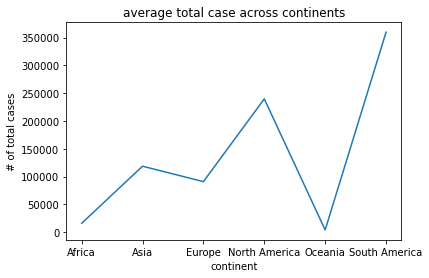

In [15]:
#so here we find the average of the new cases in each continent
data_worldwide_avg = data_worldwide.groupby(data_worldwide['continent']).mean().reset_index()

#but what does it look like? let's plot it.
plt.plot(data_worldwide_avg['continent'], data_worldwide_avg['total_cases'])

plt.xlabel('continent')
plt.ylabel('# of total cases')
plt.title('average total case across continents')


So using this, we can compare that the amount of total cases there are currently for each continent. From this we can see that Africa and Oceania both have significantly low levels of total cases in each county compared to the other continents. We can also see that North America and South America has higher total amount of cases, probably due to higher amount of interactions among individuals who tested positive.


Next, we will also look at the rate at which the amount of cases grew in each continent. We will do this by plotting time on the x-axis as a factor of months. In order to acheive this, we need to seperate each continent from the worldwide data and find the means of each per month. We can then plot this information.

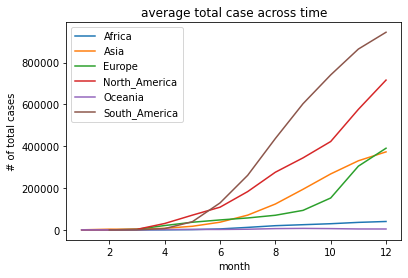

In [16]:
#splitting the data by continent
df = data_worldwide.groupby(by = data_worldwide['continent'], as_index=False)

#setting the months as numerical values such that January corresponds to 1 and December to 12
months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

#for each continent we will find the mean per month and plot it
Africa = df.get_group('Africa')
Africa_means = Africa.groupby(by = ['month']).mean()
Africa_means['month'] = months
plt.plot(Africa_means['month'], Africa_means['total_cases'], label = "Africa")


Asia = df.get_group('Asia')
Asia_means = Asia.groupby(by = ['month']).mean()
Asia_means['month'] = months
plt.plot(Asia_means['month'], Asia_means['total_cases'], label = "Asia")

Europe = df.get_group('Europe')
Europe_means = Europe.groupby(by = ['month']).mean()
Europe_means['month'] = months
plt.plot(Europe_means['month'], Europe_means['total_cases'], label = "Europe")

North_America = df.get_group('North America')
North_America_means = North_America.groupby(by = ['month']).mean()
North_America_means['month'] = months
plt.plot(North_America_means['month'], North_America_means['total_cases'], label = "North_America")

Oceania = df.get_group('Oceania')
Oceania_means = Oceania.groupby(by = ['month']).mean()
Oceania_means['month'] = months
plt.plot(Oceania_means['month'], Oceania_means['total_cases'], label = "Oceania")

South_America = df.get_group('South America')
South_America_means = South_America.groupby(by = ['month']).mean()
South_America_means['month'] = months
plt.plot(South_America_means['month'], South_America_means['total_cases'], label = "South_America")

plt.xlabel('month')
plt.ylabel('# of total cases')
plt.title('average total case across time')
plt.legend()

From this line graph, we can see how the continents compare over time with respect to total cases. We can see that over time, both Africa and Oceania don't increase drastically, which supports the fact that we saw these two continents with the lowest amount of total average cases. Same with the vice versa of North America and South America. This is also interesting because we can see when cases started to pick up for certain countries. For example, cases started to increase in May-June for the Americas, while for Europe, we see it drastically increasing after October. 

Next, we will be visualizing data of total cases throughout the world and this can be best visualized using a chloropleth map which should easily be a way in order to look at the data worldwide and see the number of COVID-19 cases. This can be done with a time slider as well in order to better ensure the fact that there can be a visualization of the daily change in COVID-19 cases throughout the world. 

In [17]:
#Legend updates as the number of cases change
fig = px.choropleth(data_frame = data_worldwide, 
                    locations= "iso_code",
                    color= "total_cases",
                    hover_name= "location",
                    color_continuous_scale= 'sunset', 
                    animation_frame= "date")
fig.show()

It is clear that though China starts off as the highest number of cases, over time it significantly decreases quickly posssibly because they were in lockdown for awhile. Next, America, Brazil, and India definitely slowly begin to increase and then around April it begins to increase quite rapidly everywhere and it stays quite high with a total number of cases everywhere. America definitely seems to be on the higher part of the spectrum. 

So now we have seen how the continents compare. Let's be more specific and look at a smaller (yet still big) sample: North America. So to begin with, we will look at North America's timeline. Using this timeline, we will run regression models on it to see which fits the best.

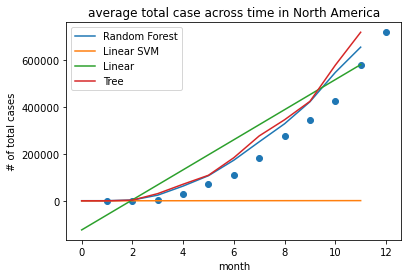

In [18]:
#extracting data for north america from the worldwide data
df = data_worldwide.groupby(by = data_worldwide['continent'], as_index=False)
North_America = df.get_group('North America')

#so let's plot the average monthly total cases
North_America_means = North_America.groupby(by = ['month']).mean()
North_America_means['month'] = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
plt.scatter(North_America_means['month'], North_America_means['total_cases'])

#now, using this, we can find a regression curve to predict.
#Except how do we know which regression to use?
#let's try a couple:

#first we define our variables, x as the month, y as the total cases
x = np.array(North_America_means['month'])
x = np.reshape(x, (x.size, 1))
y = np.array(North_America_means['total_cases'])

#Random Forest regression model
reg = ensemble.RandomForestRegressor()
reg.fit(x, y) 
curve = reg.predict(x)
plt.plot(curve, label = "Random Forest")

#Linear SVM regression model
reg = svm.LinearSVR()
reg.fit(x, y) 
curve = reg.predict(x)
plt.plot(curve, label = "Linear SVM")

#Linear regression model
reg = lm.LinearRegression()
reg.fit(x, y)
curve = reg.predict(x)
plt.plot(curve,label = "Linear")

#Decision tree regression model
reg = tree.DecisionTreeRegressor()
reg.fit(x, y)
curve = reg.predict(x)
plt.plot(curve, label = "Tree")

#then we will plot each and see which is the best predictor
plt.xlabel('month')
plt.ylabel('# of total cases')
plt.title('average total case across time in North America')
plt.legend()

So, now we have some regression models for total cases over time in North America. For Linear SVM, we can clearly see that the prediction does not nearly match the actual scattered data points, as it remains at zero thoughout the year. For Linear, we see that it starts at the actual data and ends at the actual data, however, in the middle months, it does not accurately represent the actual data. We then have Tree and Random Forest left, which both seems to be an accurate representation. However, the blue line representing Random Forest still follows closer to the actual data than the Decision Tree regression. Thus, we can see that the Random Forest model best predicts our data. 

Another thing in our analysis that we can do is compare the cases on a state level. Here we already have data on North America and visually, we will create a map to represent the total cases in each state over time. 

In [19]:
#drops duplicates, but keeps last occurence in the table, which represents the latest updated one
data_amer_april = data_america_april.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_may = data_america_may.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_june = data_america_june.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_july = data_america_july.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_aug = data_america_aug.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_sept = data_america_sept.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_oct =  data_america_oct.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_nov = data_america_nov.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_dec = data_america_dec.drop_duplicates(subset = ['Province_State'],keep='last')
data_amer_april


,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3,Testing_Rate,Hospitalization_Rate
58,Recovered,US,2020-04-30 02:32:31,NaN,NaN,0,0,120720.0,-120720.0,NaN,NaN,NaN,NaN,NaN,84070001,USA,NaN,NaN
0,Alabama,US,2020-05-01 02:32:32,32.3182,-86.9023,7187,272,0.0,6816.0,1.0,151.165615,87196.0,978.0,3.837472,84000001,USA,1859.627115,13.797968
1,Alaska,US,2020-05-01 02:32:32,61.3707,-152.4044,355,9,252.0,94.0,2.0,59.389476,19119.0,NaN,2.535211,84000002,USA,3198.499705,NaN
2,American Samoa,US,2020-05-01 02:32:32,-14.2710,-170.1320,0,0,0.0,0.0,60.0,0.000000,3.0,NaN,NaN,16,ASM,5.391708,NaN
3,Arizona,US,2020-05-01 02:32:32,33.7298,-111.4312,7655,320,1499.0,5836.0,4.0,105.169634,71786.0,1169.0,4.180274,84000004,USA,986.245241,15.271065
4,Arkansas,US,2020-05-01 02:32:32,34.9697,-92.3731,3281,61,1305.0,1915.0,5.0,126.727145,48379.0,402.0,1.859189,84000005,USA,1868.617052,12.252362
5,California,US,2020-05-01 02:32:32,36.1162,-119.6816,50130,2031,0.0,48099.0,6.0,127.854538,625337.0,NaN,4.051466,84000006,USA,1594.896734,NaN
6,Colorado,US,2020-05-01 02:32:32,39.0598,-105.3111,15284,777,2415.0,12092.0,8.0,269.710682,71059.0,2621.0,5.083748,84000008,USA,1253.949972,17.148652
7,Connecticut,US,2020-05-01 02:32:32,41.5978,-72.7554,27700,2257,0.0,25443.0,9.0,776.936050,97133.0,NaN,8.148014,84000009,USA,2724.409003,NaN
8,Delaware,US,2020-05-01 02:32:32,39.3185,-75.5071,4734,152,1275.0,3307.0,10.0,486.154756,21820.0,NaN,3.210815,84000010,USA,2240.789349,NaN


In [20]:
#a map for total cases by month
monthly_map1 = folium.Map(location=[48, -102], zoom_start=3)

In [21]:
from folium.plugins import FastMarkerCluster

#for each month and state, we will add a marker to the map with radius as the total cases
april = folium.map.FeatureGroup(name="april").add_to(monthly_map1)
for index, row in data_amer_april.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='orange',
                fill_opacity=0.05
        ).add_to(april)

may = folium.map.FeatureGroup(name="may").add_to(monthly_map1)
for index, row in data_amer_may.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='yellow',
                fill_opacity=0.05
        ).add_to(may)

june = folium.map.FeatureGroup(name="june").add_to(monthly_map1)
for index, row in data_amer_june.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='white',
                fill_opacity=0.05
        ).add_to(june)
july = folium.map.FeatureGroup(name="july").add_to(monthly_map1)
for index, row in data_amer_july.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='purple',
                fill_opacity=0.05
        ).add_to(july)
aug = folium.map.FeatureGroup(name="aug").add_to(monthly_map1)
for index, row in data_amer_aug.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='pink',
                fill_opacity=0.05
        ).add_to(aug)
sept = folium.map.FeatureGroup(name="sept").add_to(monthly_map1)
for index, row in data_amer_sept.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='gray',
                fill_opacity=0.05
        ).add_to(sept)
        
octo = folium.map.FeatureGroup(name="oct").add_to(monthly_map1)
for index, row in data_amer_oct.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='crimson',
                fill_opacity=0.05
        ).add_to(octo)
        
nov = folium.map.FeatureGroup(name="nov").add_to(monthly_map1)
for index, row in data_amer_nov.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='#3186cc',
                fill_opacity=0.05
        ).add_to(nov)
dec = folium.map.FeatureGroup(name="dec").add_to(monthly_map1)
for index, row in data_amer_dec.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['Confirmed'],
                popup = row['Confirmed'],
                fill = True,
                color='green',
                fill_opacity=0.05
        ).add_to(dec)

folium.LayerControl().add_to(monthly_map1)


In [22]:
monthly_map1

Obviously, as time goes on, we see that the radius for each circle in each state gets significantly bigger. This makes sense because it adds on from the previous month’s circle, thus getting bigger. One important thing to note is the fact that from April to December, we see such a drastic increase in the total amount of cases in each state. However, if we see the increases in cases month by month, we can see that from October to November, there was a momentous increase, rather than the gradual increase we saw monthly. This suggests that during this time, there was a peak, which we can see in the graphs above, where North America has a steeper increase during this time.

Now, when looking at the above map, we see the total cases increase a substantial amount, and this makes sense since we are adding the previous total cases with the current cases. However, we will also look at the new cases statewide. Only then can we analyze whether or not cases are actually decreasing over time, is it continuing with the trend. 

In [23]:
#a map for new cases by month
monthly_map2 = folium.Map(location=[48, -102], zoom_start=3)

In [24]:
#we can find the new cases by taking this month's total cases and subtracting
#last month's total cases from it
data_amer_april['new cases'] = data_amer_april['Confirmed']
data_amer_may['new cases'] = data_amer_may['Confirmed'] - data_amer_april['Confirmed']
data_amer_june['new cases'] = data_amer_june['Confirmed'] - data_amer_may['Confirmed']
data_amer_july['new cases'] = data_amer_july['Confirmed'] - data_amer_june['Confirmed']
data_amer_aug['new cases'] = data_amer_aug['Confirmed'] - data_amer_july['Confirmed']
data_amer_sept['new cases'] = data_amer_sept['Confirmed'] - data_amer_aug['Confirmed']
data_amer_oct['new cases'] = data_amer_oct['Confirmed'] - data_amer_sept['Confirmed']
data_amer_nov['new cases'] = data_amer_nov['Confirmed'] - data_amer_oct['Confirmed']
data_amer_dec['new cases'] = data_amer_dec['Confirmed'] - data_amer_nov['Confirmed']
data_amer_dec

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,new cases
0,Alabama,US,2020-12-20 05:30:33,32.3182,-86.9023,319904,4389,183625.0,131890.0,1.0,6524.412193,1775428.0,NaN,1.371974,84000001.0,USA,36209.688192,NaN,70380
1,Alaska,US,2020-12-20 05:30:33,61.3707,-152.4044,43688,184,7165.0,36339.0,2.0,5972.018126,1193118.0,NaN,0.421168,84000002.0,USA,163095.640049,NaN,11112
2,American Samoa,US,2020-12-20 05:30:33,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,2140.0,NaN,NaN,16.0,ASM,3846.084722,NaN,0
3,Arizona,US,2020-12-20 05:30:33,33.7298,-111.4312,448231,7937,66132.0,374162.0,4.0,6158.104512,2626177.0,NaN,1.770739,84000004.0,USA,36080.218533,NaN,121414
4,Arkansas,US,2020-12-20 05:30:33,34.9697,-92.3731,200114,3191,173832.0,23091.0,5.0,6631.113220,1927271.0,NaN,1.594591,84000005.0,USA,63863.358919,NaN,42755
5,California,US,2020-12-20 05:30:33,36.1162,-119.6816,1842557,22582,NaN,1819975.0,6.0,4663.258253,29112249.0,NaN,1.225579,84000006.0,USA,73679.096719,NaN,612293
6,Colorado,US,2020-12-20 05:30:33,39.0598,-105.3111,306598,4339,16240.0,286019.0,8.0,5324.050278,4004868.0,NaN,1.415208,84000008.0,USA,69544.219426,NaN,73693
7,Connecticut,US,2020-12-20 05:30:33,41.5978,-72.7554,162782,5581,9800.0,147401.0,9.0,4565.747442,3945648.0,NaN,3.428512,84000009.0,USA,110668.453900,NaN,45487
8,Delaware,US,2020-12-20 05:30:33,39.3185,-75.5071,50136,858,18851.0,30427.0,10.0,5148.680789,890439.0,NaN,1.711345,84000010.0,USA,91442.998509,NaN,14482
9,Diamond Princess,US,2020-12-20 05:30:33,NaN,NaN,49,0,NaN,49.0,88888.0,NaN,NaN,NaN,0.000000,84088888.0,USA,NaN,NaN,0


In [25]:
from folium.plugins import FastMarkerCluster

#for each month and state, we add a marker to the map with the radius being new cases
april = folium.map.FeatureGroup(name="april").add_to(monthly_map2)
for index, row in data_amer_april.iterrows():
    #doing this for each state in the month
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='orange',
                fill_opacity=0.05
        ).add_to(april)
may = folium.map.FeatureGroup(name="may").add_to(monthly_map2)
for index, row in data_amer_may.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='yellow',
                fill_opacity=0.05
        ).add_to(may)
june = folium.map.FeatureGroup(name="june").add_to(monthly_map2)
for index, row in data_amer_june.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='white',
                fill_opacity=0.05
        ).add_to(june)
july = folium.map.FeatureGroup(name="july").add_to(monthly_map2)
for index, row in data_amer_july.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='purple',
                fill_opacity=0.05
        ).add_to(july)
aug = folium.map.FeatureGroup(name="aug").add_to(monthly_map2)
for index, row in data_amer_aug.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='pink',
                fill_opacity=0.05
        ).add_to(aug)
sept = folium.map.FeatureGroup(name="sept").add_to(monthly_map2)
for index, row in data_amer_sept.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='gray',
                fill_opacity=0.05
        ).add_to(sept)
octo = folium.map.FeatureGroup(name="oct").add_to(monthly_map2)
for index, row in data_amer_oct.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='crimson',
                fill_opacity=0.05
        ).add_to(octo)
nov = folium.map.FeatureGroup(name="nov").add_to(monthly_map2)
for index, row in data_amer_nov.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='#3186cc',
                fill_opacity=0.05
        ).add_to(nov)
dec = folium.map.FeatureGroup(name="dec").add_to(monthly_map2)
for index, row in data_amer_dec.iterrows():
    if pd.notna(row['Long_']) and pd.notna(row['Lat']):
        folium.Circle(
                location= [row['Lat'],row['Long_']],
                radius = row['new cases'],
                popup = row['new cases'],
                fill = True,
                color='green',
                fill_opacity=0.05
        ).add_to(dec)

folium.LayerControl().add_to(monthly_map2)


In [26]:
monthly_map2

We can see that the circles and their corresponding radius are much smaller than that of the first monthly map. This is because we look at only the amount of new cases that month. From the month of April, we see that New York has a big circle, with 304372 cases (we can click on the circle to tell us how many cases there are). Then in May, we see 66398 new cases. This is much smaller than that of April, as in April, we were not prepared for this pandemic, but in May, we have started to fight it with emergency measures. The fact that there are much lower cases in May suggests that what we did in April to curb the amount of cases has relatively worked. However, in November, the big circles in many states suggest a resurgence of the virus. The reason for this might be the fact that many quarantine measures might have been lifted from the amount of low new cases since May to October, thus causing a renewal in cases. In addition, it was Thanksgiving, which generally gathers many people together. However, in December, we see the cases be significantly smaller than any other month. One reason for this is because it is currently December, so as opposed to other months, this December was a third shorter. Another reason why this could be very small is due to the fact that we saw a big peak in the amount of cases in November, which suggests we needed more safety measures. Hopefully December statistics stay small, as it only shows the numbers from before the upcoming holiday season. From this map, we can conclude that even if there are low cases, it does not mean that we can be carefree, as the amount of cases can just jump right back up. 

Okay, so we have seen the numbers of cases worldwide and more specifically,  North America. We know that there are many factors that can come into play when talking about COVID-19, so we will begin to look at factors. One factor being location. From the first few line maps earlier, we saw that different continents have differing statistics on total cases. So, perhaps location is a factor on COVID-19 cases. We can check this by creating interaction terms, one for each of the continents, and see how it affects the number of cases. We will also graph the actual data in terms of cases and the predicted data based on the interaction terms to more easily compare.

In [27]:
#adding dummies for continents
terms = pd.get_dummies(data_worldwide, columns = ['continent'])

terms['term_Africa'] = terms['continent_Africa']*terms['month']
terms['term_Asia'] = terms['continent_Asia']*terms['month']
terms['term_Europe'] = terms['continent_Europe']*terms['month']
terms['term_North America'] = terms['continent_North America']*terms['month']
terms['term_Oceania'] = terms['continent_Oceania']*terms['month']
terms['term_South America'] = terms['continent_South America']*terms['month']
terms

,iso_code,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,...,continent_Europe,continent_North America,continent_Oceania,continent_South America,term_Africa,term_Asia,term_Europe,term_North America,term_Oceania,term_South America
0,AFG,Afghanistan,2020-01-23,NaN,0.0,NaN,NaN,0.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
1,AFG,Afghanistan,2020-01-24,NaN,0.0,NaN,NaN,0.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
2,AFG,Afghanistan,2020-01-25,NaN,0.0,NaN,NaN,0.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3,AFG,Afghanistan,2020-01-26,NaN,0.0,NaN,NaN,0.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
4,AFG,Afghanistan,2020-01-27,NaN,0.0,NaN,NaN,0.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60857,ZWE,Zimbabwe,2020-12-01,10129.0,179.0,104.429,277.0,1.0,0.429,681.494,...,0,0,0,0,12,0,0,0,0,0
60858,ZWE,Zimbabwe,2020-12-02,10129.0,0.0,88.714,277.0,0.0,0.429,681.494,...,0,0,0,0,12,0,0,0,0,0
60859,ZWE,Zimbabwe,2020-12-03,10424.0,295.0,114.429,280.0,3.0,0.857,701.342,...,0,0,0,0,12,0,0,0,0,0
60860,ZWE,Zimbabwe,2020-12-04,10547.0,123.0,119.000,281.0,1.0,0.857,709.618,...,0,0,0,0,12,0,0,0,0,0


total cases = -10254568.833417684 + 2951367.84519253month +         -2946254.333301725term_Africa + -2879607.558967636term_North America + -2831780.498426022term_South America +         -2911233.505744149term_Asia + -2921517.9141034term_Europe + -2950757.2817984014term_Oceania +         10232844.02824028continent_Africa + 9977439.729240108continent_North America + 9757729.012541993continent_South America +         10094610.549450697continent_Asia + 10136855.957843516continent_Europe + 10253948.31146027continent_Oceania


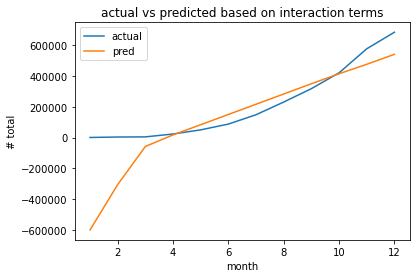

In [28]:
#picking what columns from terms we want in our fit
terms = terms[terms['total_cases'].notna()]
term = ['month', 'term_Africa', 'term_North America','term_South America','term_Asia',
        'term_Europe', 'term_Oceania', 'continent_Africa', 'continent_North America',
        'continent_South America','continent_Asia', 'continent_Europe', 'continent_Oceania']

#setting our variables for the regression
x = terms[term]
y = terms['total_cases']

#creating our regression
reg = lm.LinearRegression()
reg.fit(x, y) 

#getting our prediction with interaction terms
prediction = reg.predict(terms[term])
terms['pred'] = prediction

coef = reg.coef_
intercept = reg.intercept_

#printing out our resulting equation with our coefficients
print(f'total cases = {intercept} + {coef[0]}{term[0]} + \
        {coef[1]}{term[1]} + {coef[2]}{term[2]} + {coef[3]}{term[3]} + \
        {coef[4]}{term[4]} + {coef[5]}{term[5]} + {coef[6]}{term[6]} + \
        {coef[7]}{term[7]} + {coef[8]}{term[8]} + {coef[9]}{term[9]} + \
        {coef[10]}{term[10]} + {coef[11]}{term[11]} + {coef[12]}{term[12]}')

#now we can plot actual vs predicted average total cases

total_cases = terms.groupby(['month'])['total_cases'].mean()
pred_cases = terms.groupby(['month'])['pred'].mean()

plt.plot( total_cases, label = 'actual')
plt.plot(pred_cases, label = 'pred')

plt.xlabel('month')
plt.ylabel('# total')
plt.title('actual vs predicted based on interaction terms')
plt.legend()


So from the above equation with the interaction terms, we see that the dummy variables start with “continent_” and the interaction terms start with “term_”. The equation tells us that the continent does make a drastic difference in the amount of cases total. For example, earlier we saw that North America has much more cases than Oceania, and we can see this difference with the coefficients: 9977439.729240108continent_North America and 10253948.31146027continent_Oceania. In addition, using this interaction term model and looking at the graph, the actual versus the predicted data is relatively similar. This shows that the continents do have an effect on the amount of total cases. In addition, it does intersect at two points, thus showing that for the months of April and October, the interaction term was completely accurate.

Another factor that we can look at is the lockdown period. We will plot the lockdown periods and the amount of cases for that period (in each area) to see how quarantine affects COVID-19 cases.

In [29]:
#We only want one of each area of the lockdown dates and totals, so we
#drop duplicates
combined_data = combined_data.drop_duplicates(subset = ['Country'])
combined_data

,Country,Place,Start date,End date,Level,update,Confirmed,total_cases
0,China,Xiangyang,2020-01-28,2020-03-25,City,2020-02-04,True,94821.0
17,Philippines,Soccsksargen,2020-03-23,2020-04-30,Region,2020-03-12,False,456562.0
22,Montenegro,Tuzi,2020-03-24,NaT,Municipality,2020-03-16,False,43390.0
24,Fiji,Lautoka,2020-03-20,2020-04-07,City,2020-03-19,False,46.0
26,Liberia,Margibi,2020-03-23,2020-04-11,County,2020-03-21,False,1779.0
...,...,...,...,...,...,...,...,...
205,Cuba,NaN,2020-03-23,2020-07-20,National,2020-09-01,True,9893.0
206,Costa Rica,NaN,2020-03-23,2020-08-01,National,2020-09-01,True,157472.0
207,Bangladesh,NaN,2020-03-26,2020-04-29,National,2020-09-01,True,498293.0
208,Albania,NaN,2020-03-10,2020-04-19,National,2020-09-01,True,52004.0


Text(0.5, 1.0, 'total cases with respect to start lockdown date')

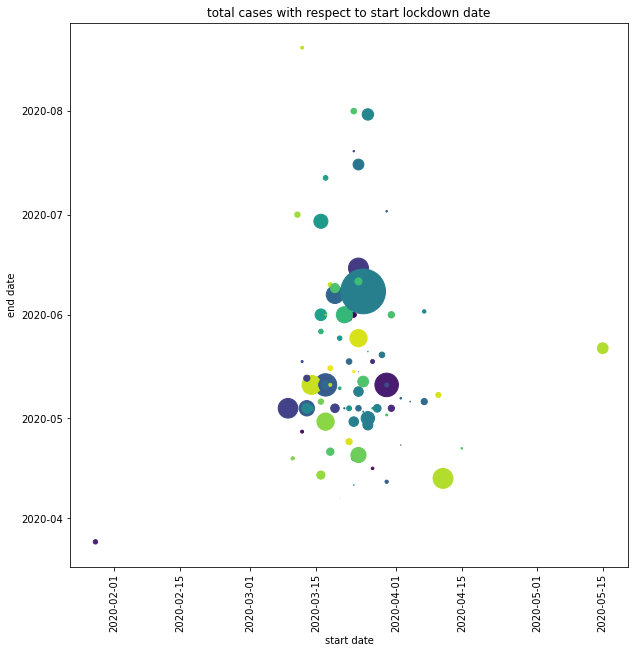

In [30]:
#setting the figure size and choosing dot colors
plt.figure(figsize=(10,10))
colors = np.random.rand(len(combined_data))

#scattering the data points based on start and end lockdown dates, with radius of total cases (all divided by 5000)
plt.scatter(combined_data['Start date'], combined_data['End date'], s=(combined_data['total_cases'])/5000,  c=colors)
    
plt.xlabel('start date')
plt.xticks(rotation=90)
plt.ylabel('end date')
plt.title('total cases with respect to start lockdown date')


Based on this previous graph, we can see that, unlike our hypothesis, there is no direct correlation between starting lockdown earlier and for longer periods of time. As there are multiple dots of differing sizes, which shows the amount of cases in relation to the other dots, there is no obvious trend. Many areas start lockdown around mid-March to April, and end anywhere from April to July, and they are all relatively close in size. There is an outlier in this timeframe however, where it is much larger than the rest. As this outlier is in the time frame as other areas, we see that when starting lockdown and when ending lockdown does not have an effect on the total number of cases. 


Here, we will discuss the correlation of different factors such as population density, older individuals (70 or older), extreme poverty, cardiovascular death rate, smokers, as well as handwashing facilities and their correlation with total and new cases as well as deaths. This allows for an understand to see where it seems to be strongly correlated whereas others where it is not. Without having this, there are many who have incorrect assumptions of correlations that may not exist and having data to see it would definitely be beneficial.

In [31]:
#Have the x-values with the heatmap dataframe
heatmap_x = ['total_cases', 'new_cases', 'total_deaths', 'new_deaths', 'new_tests', 'positive_rate', 'tests_units']
data_worldwide_x = data_worldwide[heatmap_x]
data_worldwide_x

,total_cases,new_cases,total_deaths,new_deaths,new_tests,positive_rate,tests_units
0,NaN,0.0,NaN,0.0,NaN,NaN,NaN
1,NaN,0.0,NaN,0.0,NaN,NaN,NaN
2,NaN,0.0,NaN,0.0,NaN,NaN,NaN
3,NaN,0.0,NaN,0.0,NaN,NaN,NaN
4,NaN,0.0,NaN,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...
60857,10129.0,179.0,277.0,1.0,1029.0,0.088,tests performed
60858,10129.0,0.0,277.0,0.0,1862.0,0.069,tests performed
60859,10424.0,295.0,280.0,3.0,NaN,NaN,NaN
60860,10547.0,123.0,281.0,1.0,NaN,NaN,NaN


In [32]:
#Have the y-values with the heatmap dataframe
heatmap_y = ['population_density', 'aged_70_older', 'extreme_poverty', 'cardiovasc_death_rate', 'handwashing_facilities']
data_worldwide_y = data_worldwide[heatmap_y]
data_worldwide_y['smokers'] = data_worldwide['female_smokers'] + data_worldwide['male_smokers']
data_worldwide_y


,population_density,aged_70_older,extreme_poverty,cardiovasc_death_rate,handwashing_facilities,smokers
0,54.422,1.337,NaN,597.029,37.746,NaN
1,54.422,1.337,NaN,597.029,37.746,NaN
2,54.422,1.337,NaN,597.029,37.746,NaN
3,54.422,1.337,NaN,597.029,37.746,NaN
4,54.422,1.337,NaN,597.029,37.746,NaN
...,...,...,...,...,...,...
60857,42.729,1.882,21.4,307.846,36.791,32.3
60858,42.729,1.882,21.4,307.846,36.791,32.3
60859,42.729,1.882,21.4,307.846,36.791,32.3
60860,42.729,1.882,21.4,307.846,36.791,32.3


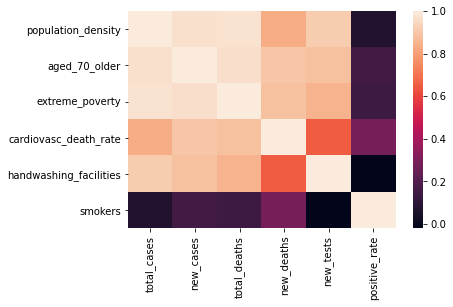

In [33]:
#Correlation map with x and y respective values
corrx = data_worldwide_x.corr()
corry = data_worldwide_y.corr()
sns.heatmap(corrx, xticklabels=corrx.columns, yticklabels=corry.columns)

From this, it is clear to see analyze that there is a high correlation with population density with number of cases, deaths, but not positivity rate. This makes sense as we know COVID-19 can be spread easily through contact bewteen people. Not only that, but there is a high correlation with older individuals (70 or older), extreme poverty, cardiovascular death rate, and handwashing facilities with everything but positivity rate. This also makes sense as we know COVID-19 has less of a prevalence with younger and healthier people. Areas with many smokers do not have a high correlation rate with cases except they do have a high correlation with positivity rates which is very interesting. Overall, this shows that more focus needs to go onto areas with high population density, extreme poverty, older individuals, especially with the vaccine and preventing spikes.

### Conclusion

After looking more into detail of the specifics of COVID-19 cases, it is clear that America had many COVID-19 cases, and not only that but worldwide, the start lockdown dates do not seem to have a direct correlation with a higher amount of total cases as we initially predicted. However, another one of our initial predictions regarding population density, poverty, older inviduals, and handwashing facilities all seemed to have a high amount of correlation to total cases. 

What can really be seen is that looking at the worldwide map of COVID-19 cases over time, there seemed to be a high amount of cases in China, however they had quickly come down compared to America which rose up and consistently stayed high. Then it start going lower and then spiked up again recently. Our goal with this analysis is to figure out how to lower the amount of COVID-19 cases and eventually bring it to 0- so what did China do in order to lower their cases and what can America do to attempt to implement a similar thing? Definitely a lockdown seems to be a valuable option, although an earlier start for a lockdown did not seem to have a high correlation with the low amount of total cases, but it may allow for a better situation with new cases. 

Analyzing COVID-19 data first throughout the world based on continents and then based on time we feel as though gave a great visualization in order to really understand what was happening and at what time periods certain places had a spike and why. This will also help gauge when to release the vaccine in those locations and before what time it would be important to do so. Not only that, but looking at America per month and visualizing the new cases allowed to see for what reasons there would be spikes and it is clear that during holiday seasons when family and friends are visiting it spikes (like november in the new cases). There are many factors that cause for spikes, and though there is a vaccine, it may not get to everyone soon enough and before losing more lives it is important to understand the pattern and see where we can improve, happy holidays everyone!